ENV: spatial_ced_2

In [1]:
import pandas as pd
import scanpy as sc
import numpy as np
# import spatialdata as sd
# import spatialdata_io
import scanpy as sc
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
np.random.seed(0)
import geopandas as gpd
import matplotlib.pyplot as plt
# import spatialdata_plot
import os
# import dask.dataframe as dd
from datetime import datetime
from scipy.sparse import csc_matrix
from scipy.io import savemat
import dill
import scipy
import json
import squidpy as sq
import spatialdata_plot
import sys
import session_info2

paper_path = "/mnt/x/Common/Lab_Papers/shedding_potential/utils/"
sys.path.append(paper_path)
import shed_funcs

/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method descriptor in future Python versions; wrap it in enum.member() if you want to preserve the old behavior
  left = partial(_left_join_spatialelement_table)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:533: FutureWarning: functools.partial will be a method descriptor in future Python versions; wrap it in enum.member() if you want to preserve the old behavior
  left_exclusiv

In [2]:
from spatialdata_plot.pl.utils import set_zero_in_cmap_to_transparent

# let's display the areas where no expression is detected as transparent
new_cmap = set_zero_in_cmap_to_transparent(cmap="viridis")
# new_cmap

## split samples

In [3]:
vhd_samples = pd.read_excel("/mnt/x/common/joint_projects/spatial_celiac/20250622_visiumhd_samples.xlsx")
slides = vhd_samples.loc[:,"slide"].unique()
print(slides)
vhd_samples.head()

['ced1' 'ct1' 'ced2_slide1d' 'ced2_slide2g']


,block_id,pt,age,sex,group,ttg,inflammation_bulb,inflammation_2nd_part,visium_batch,dv200,uscd,sample_name,block_name,notes,slide
0,1,ST_004,11.5,M,celiac,1,1.0,1.0,1,NaN,0,ST_004,ST4,NaN,ced1
1,2,ST_033,15.8,F,control,0,0.0,0.0,1,70.0,0,ST_033,"ST33,P36",NaN,ct1
2,4,ST_038,6.0,M,control,0,0.0,0.0,1,77.0,0,ST_038,ST38,IgA def,ct1
3,8,ST_046,11.0,F,control,0,NaN,NaN,1,68.0,0,ST_046,ST46,NaN,ct1
4,10,ST_052,15.1,F,control,0,0.0,0.0,1,32.0,0,ST_052,ST52,NaN,ct1


In [4]:
paths_df = pd.DataFrame({
    "slide": ['ct1','ced1','slide1d','slide2g'],
    "8um_path":[
        "/mnt/x/Common/Joint_projects/spatial_celiac/visiumhd_experiment1/5_outs/CT/binned_outputs/square_008um/",
        "/mnt/x/Common/Joint_projects/spatial_celiac/visiumhd_experiment1/5_outs/CeD/binned_outputs/square_008um/",
        "/mnt/x/Common/Joint_projects/spatial_celiac/visiumhd_experiment2/5_outs/slide1d/binned_outputs/square_008um/",
        "/mnt/x/Common/Joint_projects/spatial_celiac/visiumhd_experiment2/5_outs/slide2g/binned_outputs/square_008um/"
    ], # we will take images, parquet files, hi- and low res images from these paths
    "json_path":[ # this is the manual segmentation json file
        "/mnt/x/Common/Joint_projects/spatial_celiac/visiumhd_experiment1/7_qupaths/villus_detection/control.geojson",
        "/mnt/x/Common/Joint_projects/spatial_celiac/visiumhd_experiment1/7_qupaths/villus_detection/ced.geojson",
        "/mnt/x/Common/Joint_projects/spatial_celiac/visiumhd_experiment2/7_qupaths/villus_detection/slide1d_objects.geojson",
        "/mnt/x/Common/Joint_projects/spatial_celiac/visiumhd_experiment2/7_qupaths/villus_detection/slide2g_objects.geojson"
    ],
    "pixel_classifier_json_path":[ # this is the pixel classifier json file
        "/mnt/x/Common/Joint_projects/spatial_celiac/visiumhd_experiment1/7_qupaths/pixel_classifier/control_pixel_classifier.geojson",
        "/mnt/x/Common/Joint_projects/spatial_celiac/visiumhd_experiment1/7_qupaths/pixel_classifier/ced_pixel_classifier.geojson",
        "/mnt/x/Common/Joint_projects/spatial_celiac/visiumhd_experiment2/7_qupaths/pixel_classifier/slide1d_objects.geojson",
        "/mnt/x/Common/Joint_projects/spatial_celiac/visiumhd_experiment2/7_qupaths/pixel_classifier/slide2g_objects.geojson"
    ]
})

paths_df

,slide,8um_path,json_path,pixel_classifier_json_path
0,ct1,/mnt/x/Common/Joint_projects/spatial_celiac/vi...,/mnt/x/Common/Joint_projects/spatial_celiac/vi...,/mnt/x/Common/Joint_projects/spatial_celiac/vi...
1,ced1,/mnt/x/Common/Joint_projects/spatial_celiac/vi...,/mnt/x/Common/Joint_projects/spatial_celiac/vi...,/mnt/x/Common/Joint_projects/spatial_celiac/vi...
2,slide1d,/mnt/x/Common/Joint_projects/spatial_celiac/vi...,/mnt/x/Common/Joint_projects/spatial_celiac/vi...,/mnt/x/Common/Joint_projects/spatial_celiac/vi...
3,slide2g,/mnt/x/Common/Joint_projects/spatial_celiac/vi...,/mnt/x/Common/Joint_projects/spatial_celiac/vi...,/mnt/x/Common/Joint_projects/spatial_celiac/vi...


In [5]:
fields_to_dist = ['lowest_lumen','crypt_base']
fields_to_identify = ['MM_LP_crypt','brunner','villus','immune']
macrozone_field = 'macrozone'
pixel_classifier_field = 'pixel_class'

ct1


/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/anndata/_core/anndata.py:1793: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/anndata/_core/anndata.py:1793: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/tmp/ipykernel_2760224/2089375282.py:68: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'ST_033' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  my_ad.obs.loc[cell_idx, 'sample_name'] = row['sample_name']


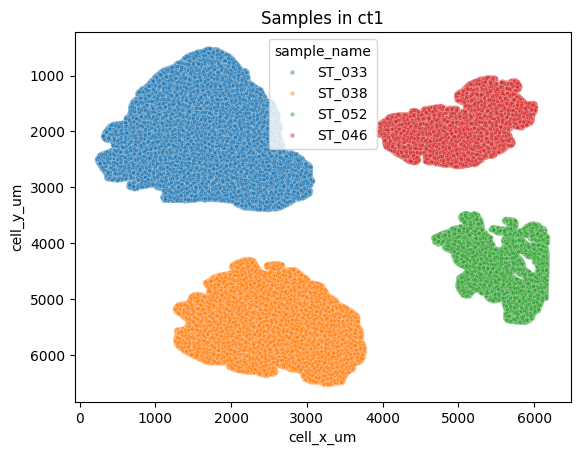

/tmp/ipykernel_2760224/2089375282.py:114: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cells_in_macrozone[field] = cells_in_macrozone.distance(geo_field_in_macrozone)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/ipykernel_2760224/2089375282.py:114: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cells_in_macrozone[field] = cells_

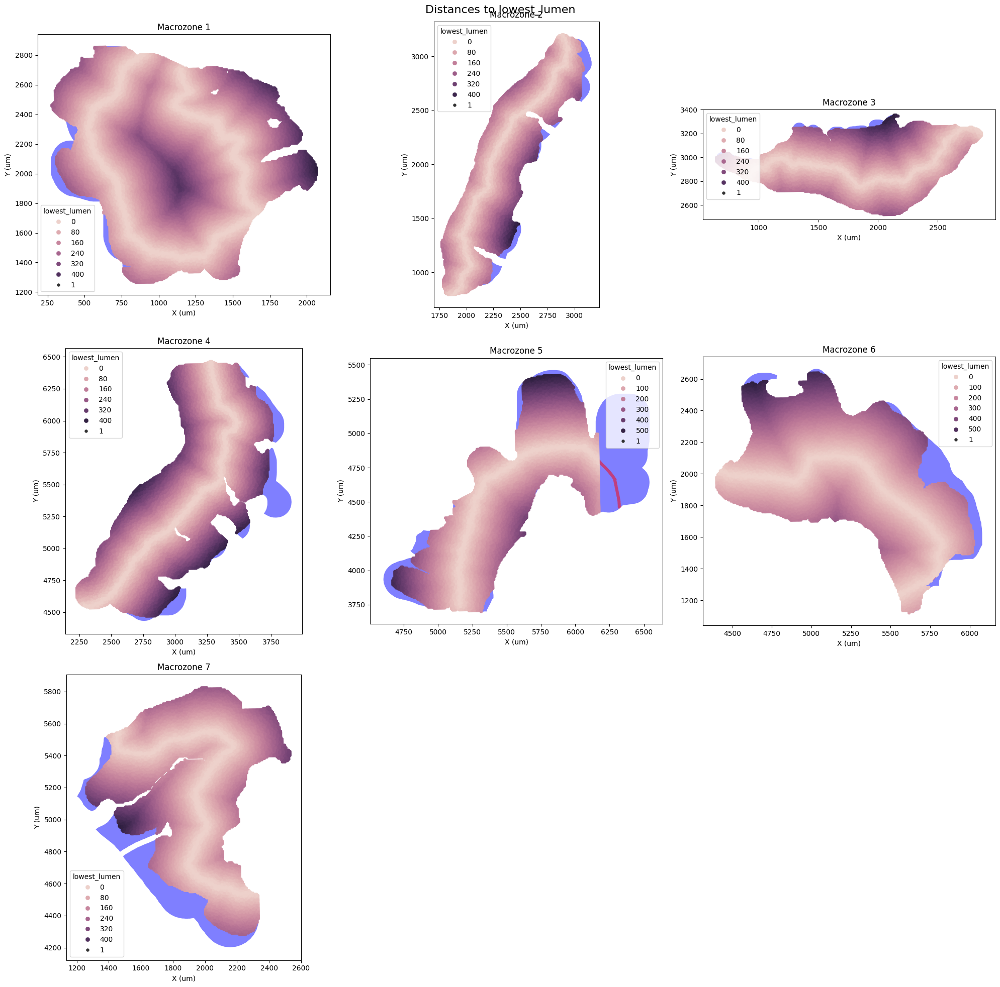

/tmp/ipykernel_2760224/2089375282.py:114: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cells_in_macrozone[field] = cells_in_macrozone.distance(geo_field_in_macrozone)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/ipykernel_2760224/2089375282.py:114: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cells_in_macrozone[field] = cells_

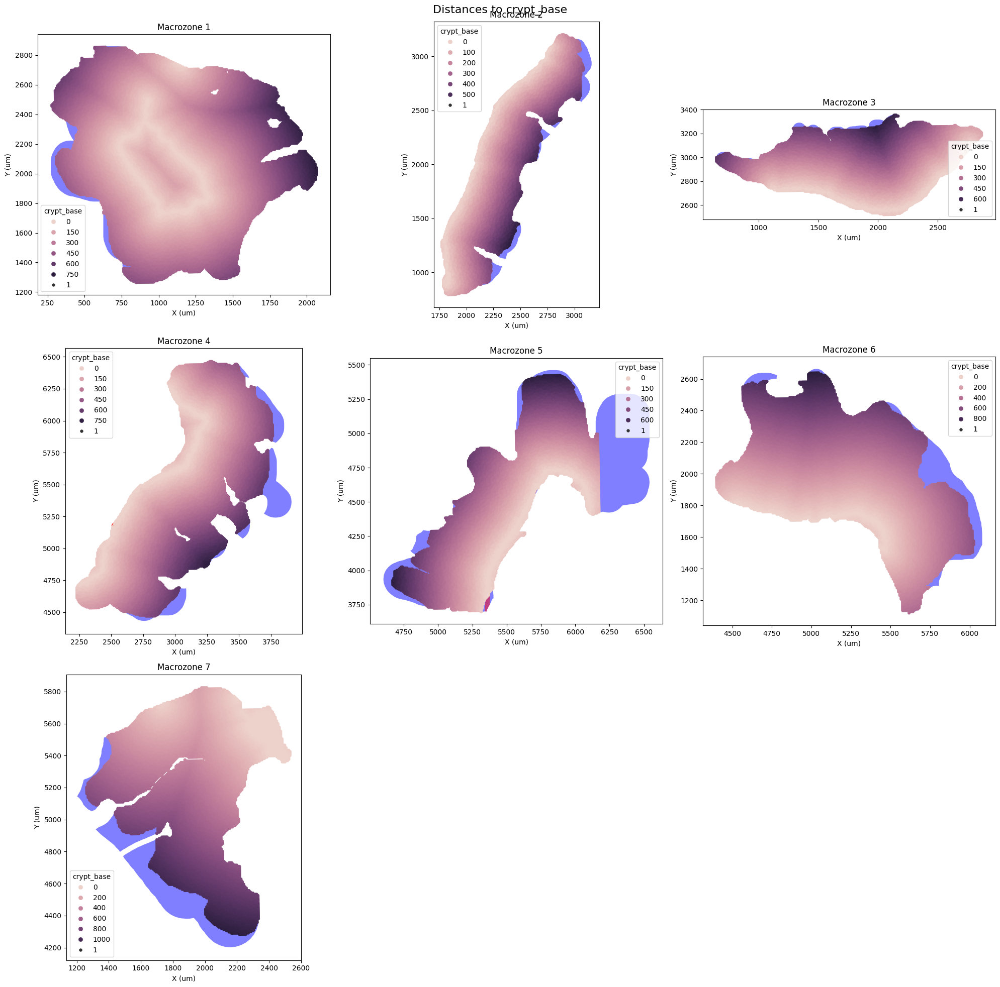

########
Pixel classifier file found for ct1. Running pixel classification.
########


/tmp/ipykernel_2760224/2089375282.py:156: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'epithelium' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  my_ad.obs.loc[class_pixels.index, pixel_classifier_field] = my_class


ced1


/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/anndata/_core/anndata.py:1793: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/anndata/_core/anndata.py:1793: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/tmp/ipykernel_2760224/2089375282.py:68: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'ST_054' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  my_ad.obs.loc[cell_idx, 'sample_name'] = row['sample_name']


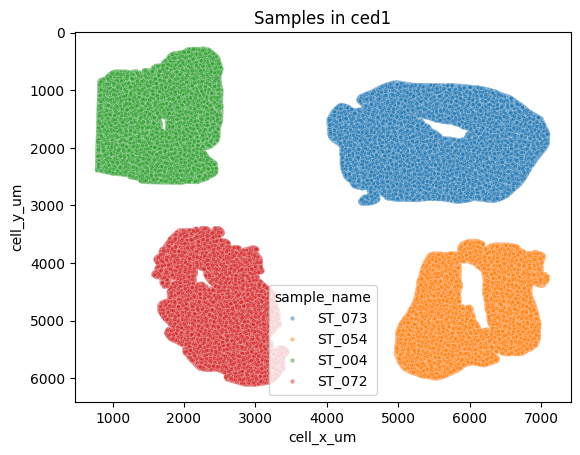

/tmp/ipykernel_2760224/2089375282.py:114: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cells_in_macrozone[field] = cells_in_macrozone.distance(geo_field_in_macrozone)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/ipykernel_2760224/2089375282.py:114: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cells_in_macrozone[field] = cells_

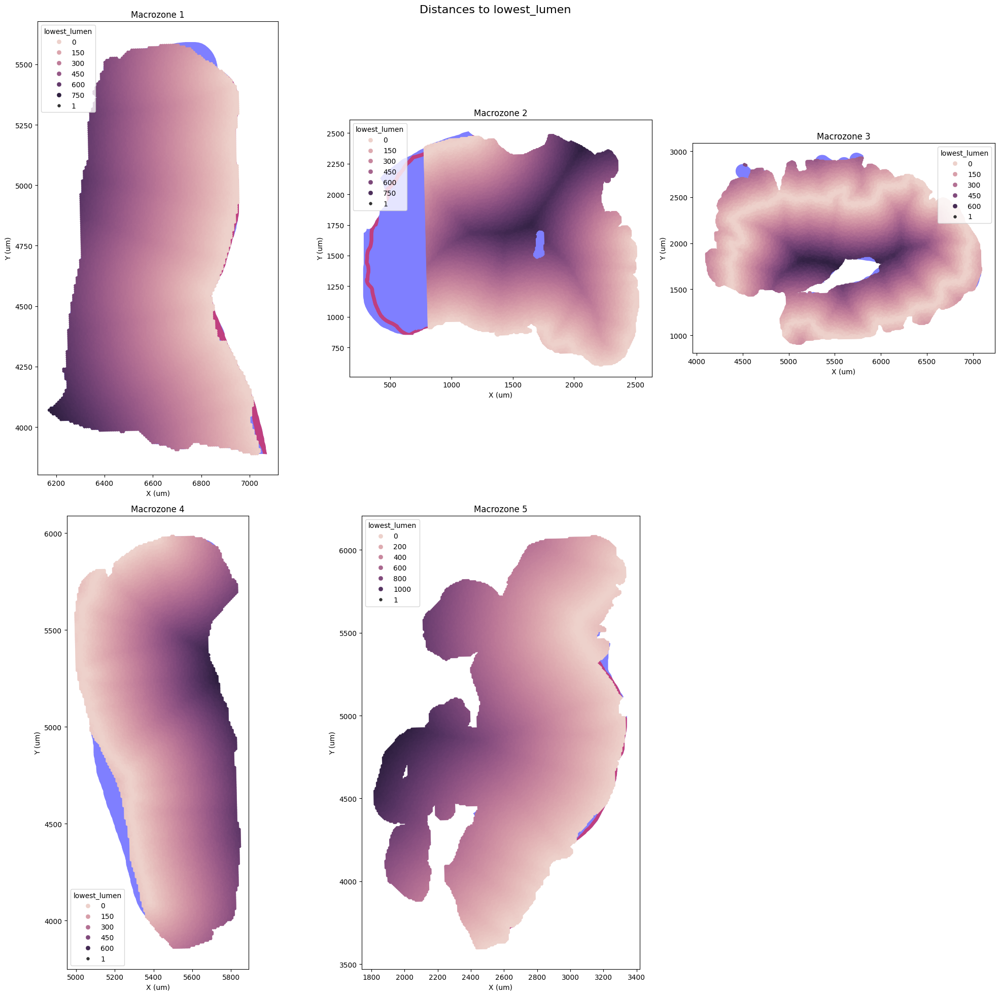

/tmp/ipykernel_2760224/2089375282.py:114: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cells_in_macrozone[field] = cells_in_macrozone.distance(geo_field_in_macrozone)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/ipykernel_2760224/2089375282.py:114: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cells_in_macrozone[field] = cells_

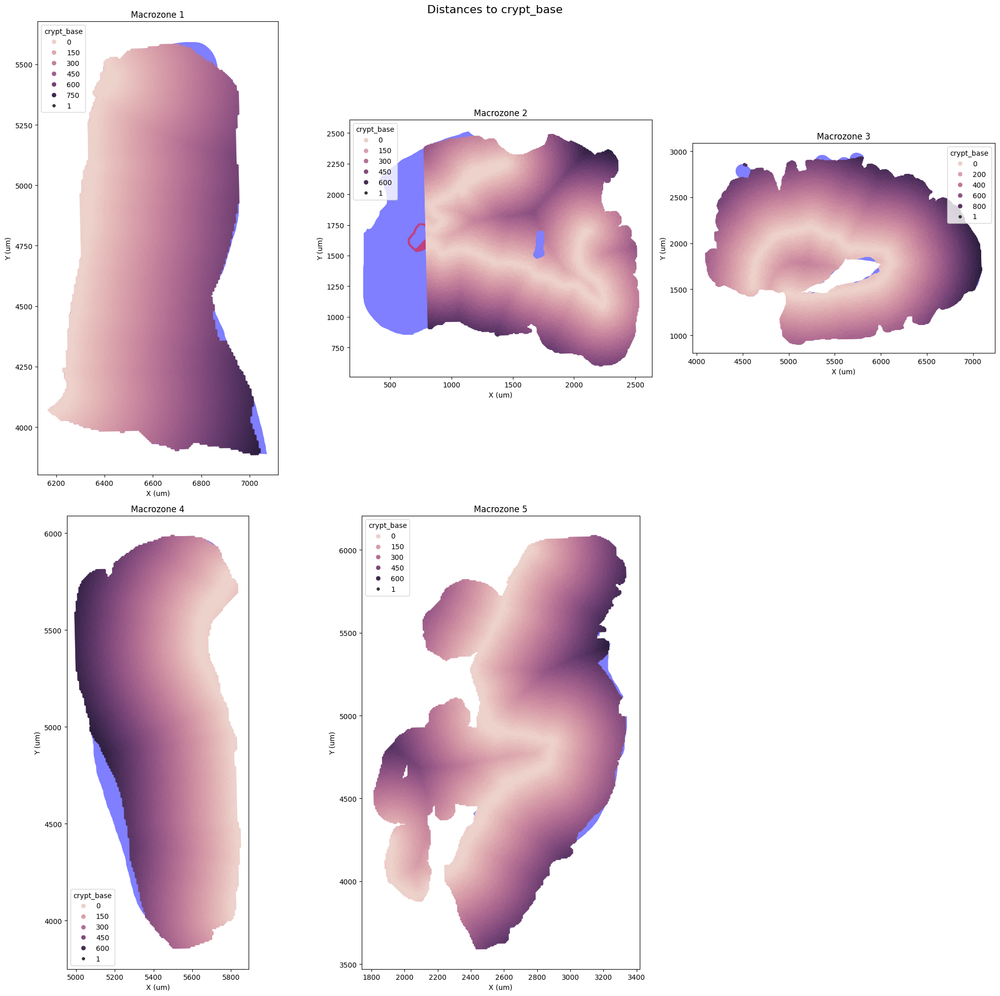

########
Pixel classifier file found for ced1. Running pixel classification.
########


/tmp/ipykernel_2760224/2089375282.py:156: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'non_epithelium' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  my_ad.obs.loc[class_pixels.index, pixel_classifier_field] = my_class


slide1d


/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/anndata/_core/anndata.py:1793: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/anndata/_core/anndata.py:1793: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/tmp/ipykernel_2760224/2089375282.py:68: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'ST_102' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  my_ad.obs.loc[cell_idx, 'sample_name'] = row['sample_name']


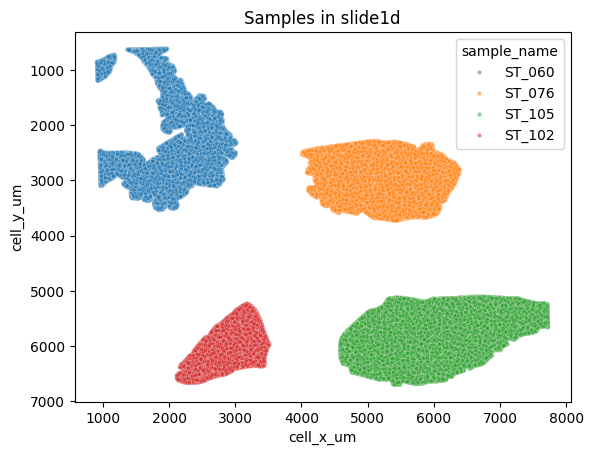

/tmp/ipykernel_2760224/2089375282.py:114: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cells_in_macrozone[field] = cells_in_macrozone.distance(geo_field_in_macrozone)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/ipykernel_2760224/2089375282.py:114: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cells_in_macrozone[field] = cells_

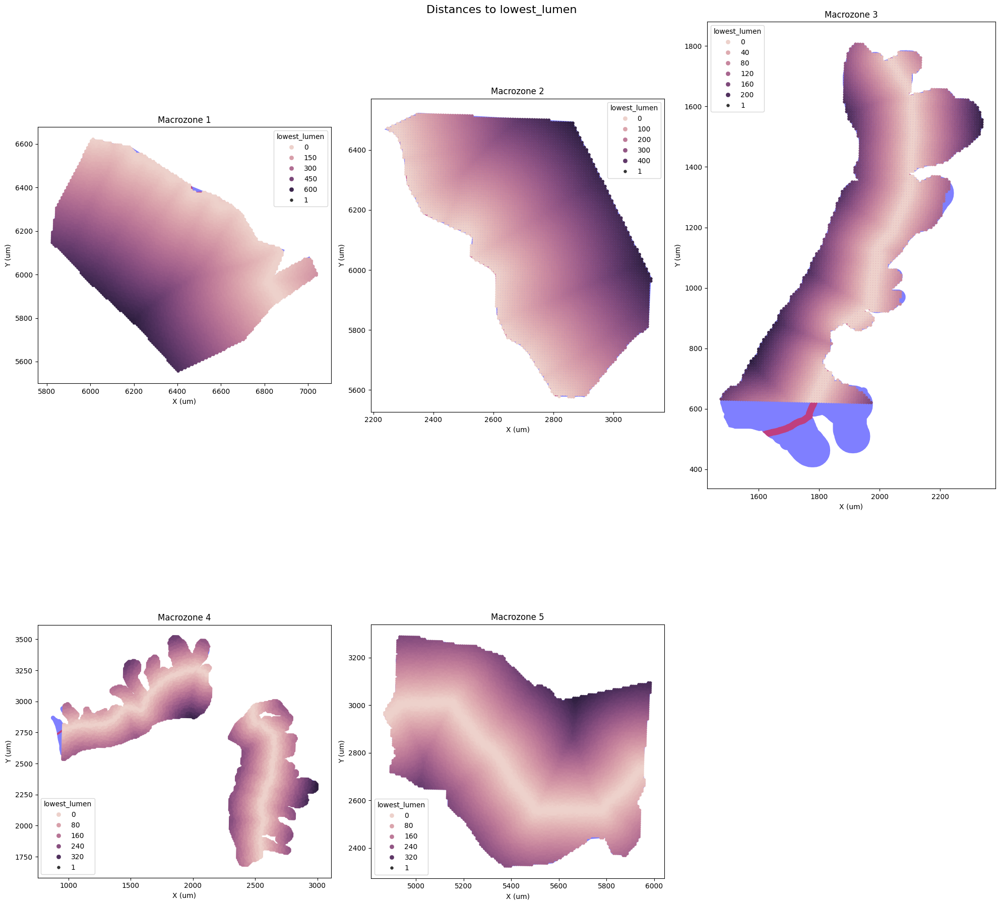

/tmp/ipykernel_2760224/2089375282.py:114: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cells_in_macrozone[field] = cells_in_macrozone.distance(geo_field_in_macrozone)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/ipykernel_2760224/2089375282.py:114: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cells_in_macrozone[field] = cells_

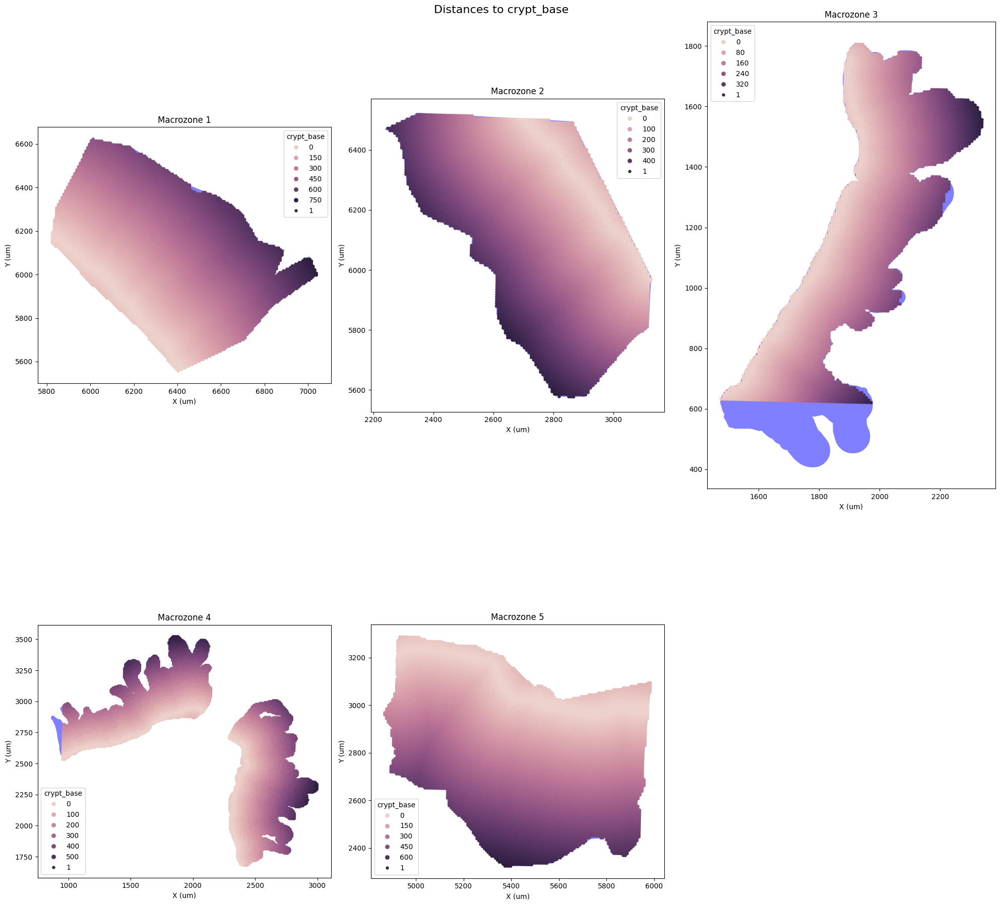

########
Pixel classifier file found for slide1d. Running pixel classification.
########


/tmp/ipykernel_2760224/2089375282.py:156: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'non_epithelium' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  my_ad.obs.loc[class_pixels.index, pixel_classifier_field] = my_class


slide2g


/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/anndata/_core/anndata.py:1793: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/anndata/_core/anndata.py:1793: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/tmp/ipykernel_2760224/2089375282.py:68: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'ST_109B1' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  my_ad.obs.loc[cell_idx, 'sample_name'] = row['sample_name']


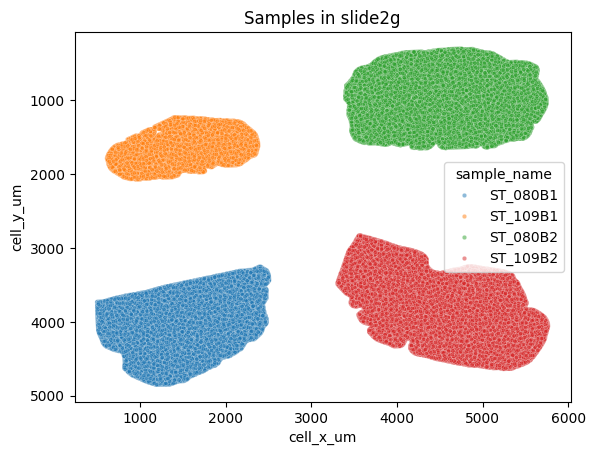

/tmp/ipykernel_2760224/2089375282.py:114: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cells_in_macrozone[field] = cells_in_macrozone.distance(geo_field_in_macrozone)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/ipykernel_2760224/2089375282.py:114: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cells_in_macrozone[field] = cells_

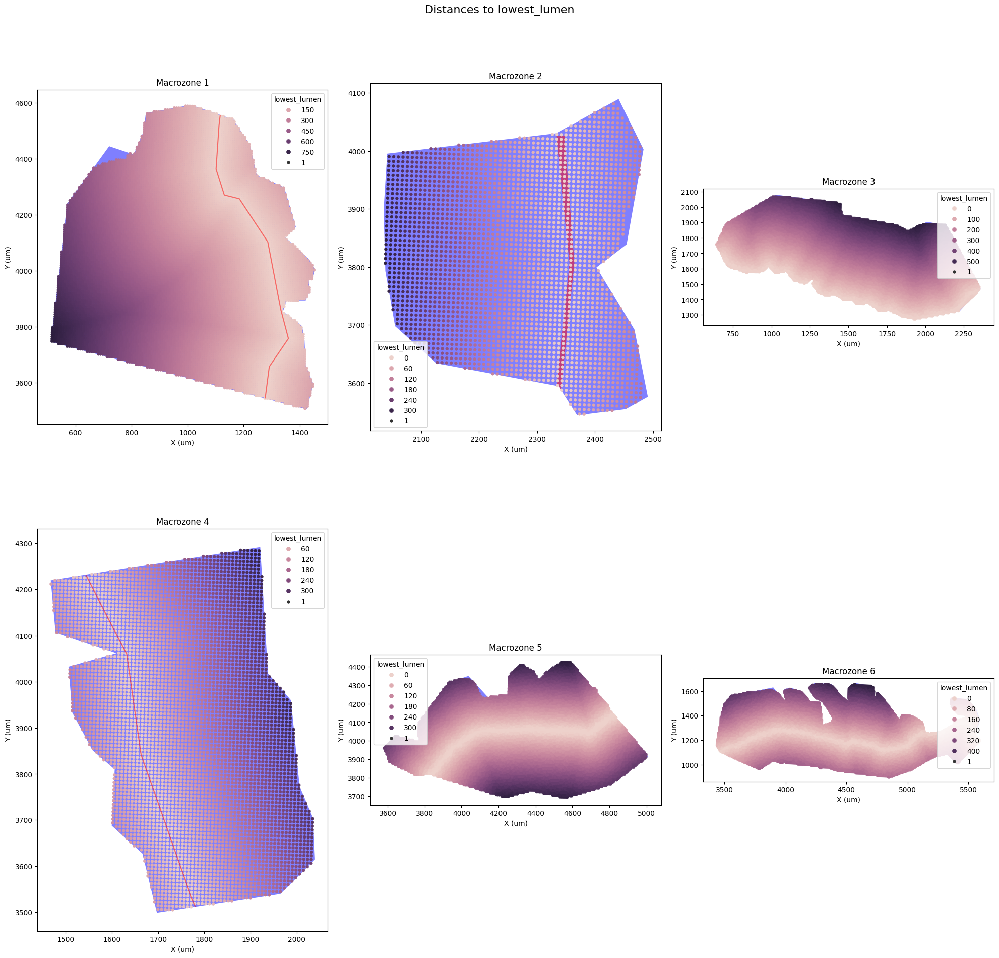

/tmp/ipykernel_2760224/2089375282.py:114: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cells_in_macrozone[field] = cells_in_macrozone.distance(geo_field_in_macrozone)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/ipykernel_2760224/2089375282.py:114: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cells_in_macrozone[field] = cells_

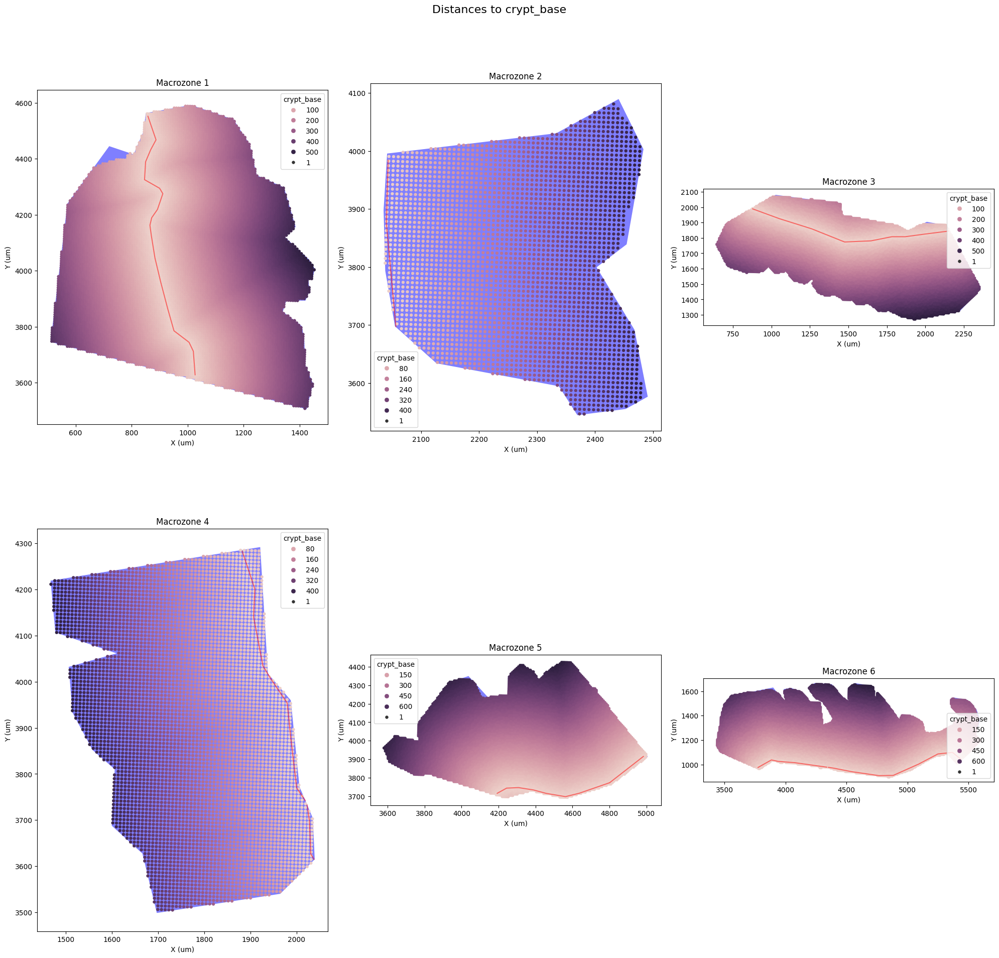

########
Pixel classifier file found for slide2g. Running pixel classification.
########


/tmp/ipykernel_2760224/2089375282.py:156: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'non_epithelium' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  my_ad.obs.loc[class_pixels.index, pixel_classifier_field] = my_class


In [6]:
slides_ad_dict = dict()
for my_slide_name in paths_df['slide']:
    print(my_slide_name)

    # get pixels locations
    my_8um_path = paths_df.loc[paths_df.slide == my_slide_name, "8um_path"].values[0]
    my_parquet_path = my_8um_path + "spatial/tissue_positions.parquet"
    my_metadata = pd.read_parquet(my_parquet_path)
    my_metadata.set_index("barcode", inplace=True)
########
    # load scalefactors
    my_scalefactors_path = my_8um_path + "spatial/scalefactors_json.json"
    with open(my_scalefactors_path, 'r') as f:
        my_scalefactors = json.load(f)
########
    # load adata
    my_ad = sc.read_10x_h5(my_8um_path + "filtered_feature_bc_matrix.h5")
    my_ad.var_names_make_unique()
    my_ad.obs = my_metadata.loc[my_ad.obs.index]
    
########
    # add images
    my_ad.uns["spatial"] = dict()
    my_ad.uns["spatial"][my_slide_name] = dict()
    my_ad.uns["spatial"][my_slide_name]["images"] = dict()
    # Load the high-resolution image
    my_ad.uns["spatial"][my_slide_name]["images"]['hires'] = plt.imread(my_8um_path+"/../../spatial/tissue_hires_image.png")
    my_ad.uns["spatial"][my_slide_name]["images"]['lowres'] = plt.imread(my_8um_path+"/../../spatial/tissue_lowres_image.png")

    # add scalefactors
    my_ad.uns["spatial"][my_slide_name]["scalefactors"] = my_scalefactors.copy()

    # add obsm
    my_ad.obsm["spatial"] = my_ad.obs[['pxl_col_in_fullres','pxl_row_in_fullres']].values

    # convert pixels x,y to microns
    my_ad.obs['cell_x_um'] = my_ad.obs.pxl_col_in_fullres * my_scalefactors['microns_per_pixel']
    my_ad.obs['cell_y_um'] = my_ad.obs.pxl_row_in_fullres * my_scalefactors['microns_per_pixel']
######

    # assign sample name to each sample
    my_geo = gpd.read_file(paths_df.loc[paths_df.slide == my_slide_name, "json_path"].values[0])
    my_geo.geometry = my_geo.geometry.scale(xfact=my_scalefactors['microns_per_pixel'], yfact=my_scalefactors['microns_per_pixel'], origin=(0, 0))

    # extract classification
    my_geo['classification'] = my_geo['classification'].apply(lambda x: x.split('"')[3])
######
    # convert obs to GeoDataFrame
    my_ad.obs = gpd.GeoDataFrame(my_ad.obs, geometry=gpd.points_from_xy(my_ad.obs['cell_x_um'], my_ad.obs['cell_y_um']))
    my_ad.obs.crs = my_geo.crs
    my_ad.obs['sample_name'] = np.nan

#####
    # add macrozone field
    my_ad.obs[macrozone_field] = np.nan
#####
    # add sample name to samples
    # select annotations that starts with "sample_" and get the string after "sample_"
    my_samples = my_geo[['classification','geometry']][my_geo['classification'].str.startswith("sample_")]
    # drop the "sample_" prefix from the classification
    my_samples['sample_name'] = my_samples['classification'].apply(lambda x: x.split("sample_")[1])

    # copy crs from my_geo to my_samples
    my_samples.crs = my_geo.crs

    for idx, row in my_samples.iterrows():
        cell_idx = gpd.sjoin(my_ad.obs, my_samples[my_samples.index == idx], how='inner', predicate='intersects').index
        my_ad.obs.loc[cell_idx, 'sample_name'] = row['sample_name']

    sns.scatterplot(my_ad.obs,x='cell_x_um', y='cell_y_um', hue='sample_name', alpha=0.5, s=10)
    # flip yaxis
    plt.gca().invert_yaxis()
    plt.title(f"Samples in {my_slide_name}")
    plt.show()
######
    # measure distances
    # init measure distances from objects
    measure_dists_from_objects = dict()
    for field in fields_to_dist:
        measure_dists_from_objects[field] = my_geo[my_geo['classification'] == field]

    # add classification to pixels
    for field in fields_to_identify:
        my_ad.obs[field] = False
        cells_idx = gpd.sjoin(my_ad.obs,my_geo[my_geo.classification==field]).index
        my_ad.obs.loc[cells_idx,field] = True
######
    my_macrozones = my_geo[my_geo['classification'] == macrozone_field]
    num_macrozones = len(my_macrozones)
    cols = int(np.ceil(np.sqrt(num_macrozones)))
    rows = int(np.ceil(num_macrozones / cols))

    # add a column to the main dataframe to store the distances from manually annotated objects

    for field in measure_dists_from_objects.keys():
        my_ad.obs[field] = np.nan
        fig, axes = plt.subplots(rows, cols, figsize=(20, 20))
        axes = axes.flatten()
        for ii, polygon in enumerate(my_macrozones.geometry):
            # fig, ax = plt.subplots()
            my_macrozone = gpd.GeoSeries(polygon)
            my_macrozone.plot(ax=axes[ii], color='blue', alpha=0.5)
            
            # intersect the lowest_lumen polygons with the macrozone
            geo_field_in_macrozone = measure_dists_from_objects[field].geometry.intersection(polygon)
            geo_field_in_macrozone = geo_field_in_macrozone[geo_field_in_macrozone.is_empty == False]
            geo_field_in_macrozone = geo_field_in_macrozone.union_all()

            gpd.GeoSeries(geo_field_in_macrozone).plot(ax=axes[ii], color='red', alpha=0.5)

            cells_in_macrozone = my_ad.obs[my_ad.obs.within(polygon)]

            # calculate the distance of every cell to the nearest lowest_lumen
            cells_in_macrozone[field] = cells_in_macrozone.distance(geo_field_in_macrozone)

            # send the distance to the lowest_lumen to the main dataframe
            my_ad.obs.loc[cells_in_macrozone.index, field] = cells_in_macrozone[field]
            my_ad.obs.loc[cells_in_macrozone.index, macrozone_field] = ii # add macrozone number to obs

            sns.scatterplot(data=cells_in_macrozone, size=1, x='cell_x_um', y='cell_y_um', hue=field, ax=axes[ii], edgecolor=None)
            axes[ii].set_title(f'Macrozone {ii+1}')
            
            axes[ii].set_xlabel('X (um)')
            axes[ii].set_ylabel('Y (um)')      

        # Hide any unused subplots
        for j in range(ii + 1, len(axes)):
            fig.delaxes(axes[j])

        fig.suptitle(f'Distances to {field}', fontsize=16)
        plt.tight_layout()
        plt.show()#.iloc[3:4].plot()

    for field in measure_dists_from_objects.keys():
        my_ad.obs.rename(columns={'field': 'dist_to_'+field}, inplace=True)

######
    # change geomertry to pxls rather than microns
    my_ad.obs = gpd.GeoDataFrame(my_ad.obs, geometry=gpd.points_from_xy(my_ad.obs['pxl_col_in_fullres'], my_ad.obs['pxl_row_in_fullres']))

    # check pixel classifier presence
    pixel_classifier_path = paths_df.loc[paths_df.slide == my_slide_name, "pixel_classifier_json_path"].values[0]
    if os.path.exists(pixel_classifier_path):
        print(f"########\nPixel classifier file found for {my_slide_name}. Running pixel classification.\n########")
        my_pixel_classifier = gpd.read_file(pixel_classifier_path)
        my_pixel_classifier['classification'] = my_pixel_classifier['classification'].apply(lambda x: x.split('"')[3]).str.lower()

        my_classes = my_pixel_classifier['classification'].unique()
        my_ad.obs[pixel_classifier_field] = np.nan
        for my_class in my_classes:
            ad_class = my_pixel_classifier.loc[my_pixel_classifier['classification'] == my_class].iloc[0]
            ad_gdf = gpd.GeoDataFrame(ad_class).T
            ad_gdf.set_geometry('geometry', inplace=True)
            ad_gdf.crs = my_ad.obs.crs
            class_pixels = gpd.sjoin(my_ad.obs, ad_gdf, how='inner', predicate='within')
            my_ad.obs.loc[class_pixels.index, pixel_classifier_field] = my_class

    else:
        print(f"########\nPixel classifier file NOT found for {my_slide_name}. SKIPPING pixel classification.\n########")
        my_ad.obs[pixel_classifier_field] = np.nan

#####
    my_ad.obs['bc'] = my_ad.obs_names
    my_ad.obs_names = my_ad.obs_names +"_"+ my_slide_name
    slides_ad_dict[my_slide_name] = my_ad

## Export raw counts before uploading

In [7]:
slides_ad_dict

{'ct1': AnnData object with n_obs × n_vars = 198623 × 18085
     obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'cell_x_um', 'cell_y_um', 'geometry', 'sample_name', 'macrozone', 'MM_LP_crypt', 'brunner', 'villus', 'immune', 'lowest_lumen', 'crypt_base', 'pixel_class', 'bc'
     var: 'gene_ids', 'feature_types', 'genome'
     uns: 'spatial'
     obsm: 'spatial',
 'ced1': AnnData object with n_obs × n_vars = 233214 × 18085
     obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'cell_x_um', 'cell_y_um', 'geometry', 'sample_name', 'macrozone', 'MM_LP_crypt', 'brunner', 'villus', 'immune', 'lowest_lumen', 'crypt_base', 'pixel_class', 'bc'
     var: 'gene_ids', 'feature_types', 'genome'
     uns: 'spatial'
     obsm: 'spatial',
 'slide1d': AnnData object with n_obs × n_vars = 152235 × 18085
     obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'cell_x_um', 'cell_y_um', 'geome

In [12]:
EXPORT_FOR_PUBLICATION = True
cols_to_drop = ["macrozone","MM_LP_crypt", "brunner","villus","immune","lowest_lumen","crypt_base","cell_x_um","cell_y_um"]
if EXPORT_FOR_PUBLICATION:
    samples_to_drop = ["ST_060","ST_073","ST_080B2","ST_109B2"]
    # make dir for export
    export_dir = os.getcwd() + "/exported_visiumhd_raw/"
    if not os.path.exists(export_dir):
        os.makedirs(export_dir)

    slides_ad_dict_export = slides_ad_dict.copy()
    for slide_name in tqdm(slides_ad_dict_export.keys()):
        ad = slides_ad_dict_export[slide_name]
        ad = ad[~ad.obs['sample_name'].isin(samples_to_drop), :].copy()
        print(f"Samples in slide {slide_name} after dropping: {ad.obs['sample_name'].unique()}")
        # drop geometry column to make compatible with h5ad
        ad.obs = ad.obs.drop(columns=['geometry'])

        # drop the other cols to drop
        ad.obs = ad.obs.drop(columns=cols_to_drop)

        # export to h5ad
        ad.write_h5ad(export_dir + f"{slide_name}.h5ad")
        # ad.obs.to_csv(export_dir + f"{slide_name}_obs.csv")
        # ad.to_df().to_csv(export_dir + f"{slide_name}_counts.csv")
        slides_ad_dict_export[slide_name] = ad
    slides_ad_dict_export

  0%|          | 0/4 [00:00<?, ?it/s]

Samples in slide ct1 after dropping: ['ST_033' 'ST_038' 'ST_052' 'ST_046' nan]


 25%|██▌       | 1/4 [00:22<01:08, 22.84s/it]

Samples in slide ced1 after dropping: ['ST_054' 'ST_004' 'ST_072' nan]


 50%|█████     | 2/4 [00:45<00:45, 22.67s/it]

Samples in slide slide1d after dropping: ['ST_076' 'ST_105' 'ST_102' nan]


 75%|███████▌  | 3/4 [00:58<00:18, 18.25s/it]

Samples in slide slide2g after dropping: ['ST_080B1' 'ST_109B1' nan]


100%|██████████| 4/4 [01:07<00:00, 16.81s/it]


In [7]:
st33 = slides_ad_dict['ct1'][slides_ad_dict['ct1'].obs['sample_name'] == "ST_033"]
st33_max_x = st33.obsm['spatial'][:, 0].max()
st33_min_x = st33.obsm['spatial'][:, 0].min()
st33_max_y = st33.obsm['spatial'][:, 1].max()
st33_min_y = st33.obsm['spatial'][:, 1].min()
st33_crop = (st33_min_x, st33_min_y, st33_max_x, st33_max_y)
print("X: [{:.2f}, {:.2f}]".format(st33_min_x, st33_max_x))
print("Y: [{:.2f}, {:.2f}]".format(st33_min_y, st33_max_y))

X: [716.96, 9577.89]
Y: [1617.93, 10594.78]


/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/anndata/_core/anndata.py:1175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/anndata/_core/anndata.py:1175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/anndata/_core/anndata.py:1175: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/anndata/_core/anndata.py:1175: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  df[key] = c
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/scanpy/plotting/_utils.py:482: ImplicitModific

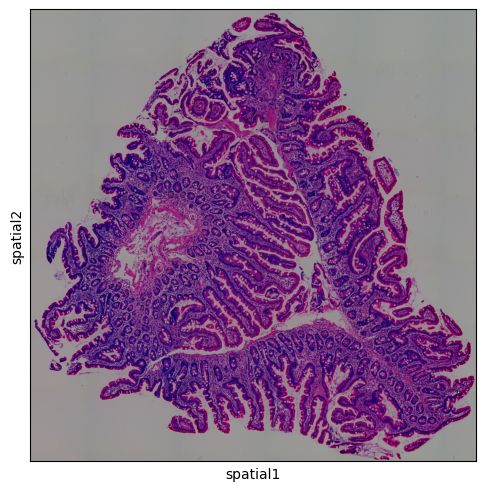

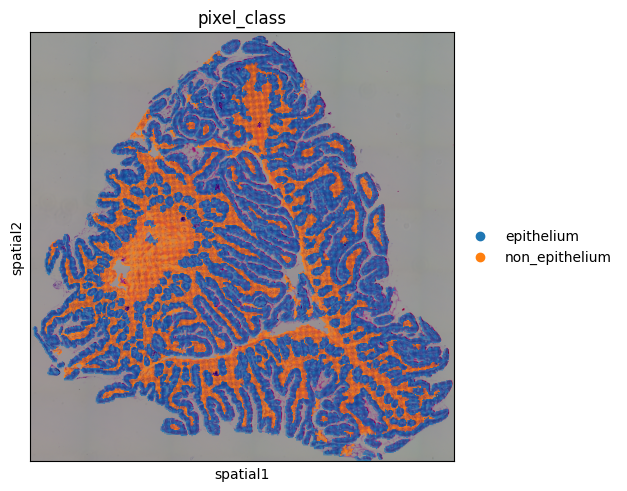

In [8]:
sq.pl.spatial_scatter(st33, crop_coord=st33_crop)
sq.pl.spatial_scatter(st33[~st33.obs['pixel_class'].isna()], crop_coord=st33_crop, color=['pixel_class'])

In [9]:
# join all anndata within the dictionary to a single anndata object
joint_ad = sc.concat(list(slides_ad_dict.values()), label='slide', keys=list(slides_ad_dict.keys()), merge='same', join="outer")
joint_ad

AnnData object with n_obs × n_vars = 718521 × 18085
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'cell_x_um', 'cell_y_um', 'geometry', 'sample_name', 'macrozone', 'MM_LP_crypt', 'brunner', 'villus', 'immune', 'lowest_lumen', 'crypt_base', 'pixel_class', 'bc', 'slide'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'

In [10]:
# calculate sum of counts per cell
joint_ad.obs['sum_of_umis'] = 0
joint_ad.obs.sum_of_umis = np.sum(joint_ad.X, axis=1).astype(int)

In [11]:
# sns.boxplot(data=joint_ad.obs, x='sample_name', y='sum_of_umis', hue='slide', showfliers=False)
# # rotate x labels
# plt.xticks(rotation=90)
# plt.title("Sum of UMIs per sample")
# plt.xlabel("Sample name")
# plt.ylabel("Sum of UMIs")
# plt.legend(title='Slide')
# plt.tight_layout()

In [12]:
# create dataframe with sample names and median sum of umis
sample_medians = joint_ad.obs.groupby('sample_name')['sum_of_umis'].median().reset_index()
sample_medians.columns = ['sample_name', 'median_sum_of_umis']
sample_medians.head()

,sample_name,median_sum_of_umis
0,ST_004,41.0
1,ST_033,135.0
2,ST_038,49.0
3,ST_046,191.0
4,ST_052,121.0


In [13]:
# add column of median_sum_of_umis to vhd samples by sample_name
vhd_samples = vhd_samples.merge(sample_medians, on='sample_name', how='left')
vhd_samples.head()

,block_id,pt,age,sex,group,ttg,inflammation_bulb,inflammation_2nd_part,visium_batch,dv200,uscd,sample_name,block_name,notes,slide,median_sum_of_umis
0,1,ST_004,11.5,M,celiac,1,1.0,1.0,1,NaN,0,ST_004,ST4,NaN,ced1,41.0
1,2,ST_033,15.8,F,control,0,0.0,0.0,1,70.0,0,ST_033,"ST33,P36",NaN,ct1,135.0
2,4,ST_038,6.0,M,control,0,0.0,0.0,1,77.0,0,ST_038,ST38,IgA def,ct1,49.0
3,8,ST_046,11.0,F,control,0,NaN,NaN,1,68.0,0,ST_046,ST46,NaN,ct1,191.0
4,10,ST_052,15.1,F,control,0,0.0,0.0,1,32.0,0,ST_052,ST52,NaN,ct1,121.0


In [14]:
# sns.scatterplot(vhd_samples, x='median_sum_of_umis', y='dv200', hue='slide', style='visium_batch')
# # calculate spearman correlation
# vhd_samples_tmp = vhd_samples.dropna(subset=['median_sum_of_umis', 'dv200'])
# [r, p] = scipy.stats.spearmanr(vhd_samples_tmp['median_sum_of_umis'], vhd_samples_tmp['dv200'])
# plt.title(f'Spearman correlation: r={r:.2f}, p={p:.2e}')
# # legend outside
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

In [15]:
print(datetime.now())

2026-01-12 09:12:39.634156


In [16]:
vhd_samples.set_index('sample_name', inplace=True, drop=False)
vhd_samples.head()
# set vhd_sapmles index as sample_name


,block_id,pt,age,sex,group,ttg,inflammation_bulb,inflammation_2nd_part,visium_batch,dv200,uscd,sample_name,block_name,notes,slide,median_sum_of_umis
sample_name,,,,,,,,,,,,,,,,
ST_004,1,ST_004,11.5,M,celiac,1,1.0,1.0,1,NaN,0,ST_004,ST4,NaN,ced1,41.0
ST_033,2,ST_033,15.8,F,control,0,0.0,0.0,1,70.0,0,ST_033,"ST33,P36",NaN,ct1,135.0
ST_038,4,ST_038,6.0,M,control,0,0.0,0.0,1,77.0,0,ST_038,ST38,IgA def,ct1,49.0
ST_046,8,ST_046,11.0,F,control,0,NaN,NaN,1,68.0,0,ST_046,ST46,NaN,ct1,191.0
ST_052,10,ST_052,15.1,F,control,0,0.0,0.0,1,32.0,0,ST_052,ST52,NaN,ct1,121.0


In [17]:
# join vhd_samples to joint_ad.obs based on sample_name
joint_ad.obs = joint_ad.obs.join(vhd_samples.drop(columns=['slide','sample_name'], inplace=False), on='sample_name', how='left')
joint_ad.obs

,in_tissue,array_row,array_col,pxl_row_in_fullres,pxl_col_in_fullres,cell_x_um,cell_y_um,geometry,sample_name,macrozone,...,group,ttg,inflammation_bulb,inflammation_2nd_part,visium_batch,dv200,uscd,block_name,notes,median_sum_of_umis
s_008um_00304_00136-1_ct1,1,304,136,7751.168412,1862.737925,599.169310,2493.245112,POINT (1862.73792 7751.16841),ST_033,0.0,...,control,0.0,0.0,0.0,1.0,70.0,0.0,"ST33,P36",NaN,135.0
s_008um_00357_00397-1_ct1,1,357,397,9187.180436,8329.479426,2679.264952,2955.153533,POINT (8329.47943 9187.18044),ST_033,NaN,...,control,0.0,0.0,0.0,1.0,70.0,0.0,"ST33,P36",NaN,135.0
s_008um_00260_00253-1_ct1,1,260,253,6709.793232,4792.292114,1541.491328,2158.275797,POINT (4792.29211 6709.79323),ST_033,0.0,...,control,0.0,0.0,0.0,1.0,70.0,0.0,"ST33,P36",NaN,135.0
s_008um_00712_00475-1_ct1,1,712,475,18050.984614,10108.571018,3251.528536,5806.289680,POINT (10108.57102 18050.98461),ST_038,3.0,...,control,0.0,0.0,0.0,1.0,77.0,0.0,ST38,IgA def,49.0
s_008um_00058_00277-1_ct1,1,58,277,1697.052709,5480.557260,1762.879075,545.874912,POINT (5480.55726 1697.05271),ST_033,NaN,...,control,0.0,0.0,0.0,1.0,70.0,0.0,"ST33,P36",NaN,135.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
s_008um_00270_00596-1_slide2g,1,270,596,3920.814902,16097.714887,5183.447077,1262.498229,POINT (16097.71489 3920.8149),ST_080B2,NaN,...,celiac,1.0,1.0,0.0,2.0,44.0,1.0,ST80B2,NaN,31.0
s_008um_00655_00060-1_slide2g,1,655,60,13948.748872,3122.234167,1005.356082,4491.482305,POINT (3122.23417 13948.74887),ST_080B1,0.0,...,celiac,1.0,1.0,0.0,2.0,72.0,1.0,ST80B1,NaN,44.0
s_008um_00565_00596-1_slide2g,1,565,596,11246.862262,16354.552530,5266.148525,3621.477690,POINT (16354.55253 11246.86226),ST_109B2,NaN,...,celiac,1.0,1.0,0.0,2.0,57.0,1.0,ST109-b2-2,NaN,25.0
s_008um_00630_00099-1_slide2g,1,630,99,13293.928641,4068.972142,1310.204703,4280.630887,POINT (4068.97214 13293.92864),ST_080B1,0.0,...,celiac,1.0,1.0,0.0,2.0,72.0,1.0,ST80B1,NaN,44.0


## Calculate layers

In [18]:
joint_ad.layers['counts'] = joint_ad.X.copy()
joint_ad.layers['mat_norm'] = sc.pp.normalize_total(joint_ad, target_sum=1, inplace=False)['X']
joint_ad.layers['log_norm'] = sc.pp.log1p(sc.pp.normalize_total(joint_ad, target_sum=10000, inplace=False)['X'], copy=True)


/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/legacy_api_wrap/__init__.py:82: UserWarning: Some cells have zero counts
  return fn(*args_all, **kw)


In [19]:
joint_ad.obs[pixel_classifier_field] = joint_ad.obs[pixel_classifier_field].str.lower()

## Add crypt and villus zones

control
ST_033


/tmp/ipykernel_1976219/1644935003.py:27: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_villi.obs['villi_part'] = pd.qcut(
/tmp/ipykernel_1976219/1644935003.py:35: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_crypt.obs['crypt_part'] = pd.qcut(
/tmp/ipykernel_1976219/1644935003.py:41: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample.obs['villi_part'] = all_ad_sample_villi.obs['villi_part']
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/matrixlib/defmatrix.py:451: RuntimeWarning: Mean of empty slice.
  return N.ndarray.mean(self, axis, dtype, out, keepdims=True)._collapse(axis)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/_core/_methods.py:136: RuntimeWarning: invalid value encountered in divide
  ret = um.true_div

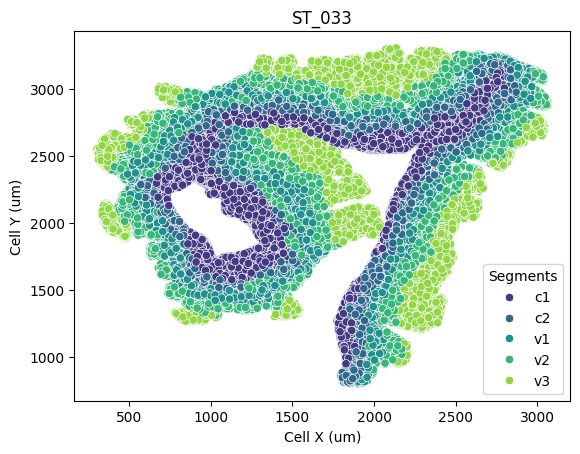

ST_038


/tmp/ipykernel_1976219/1644935003.py:27: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_villi.obs['villi_part'] = pd.qcut(
/tmp/ipykernel_1976219/1644935003.py:35: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_crypt.obs['crypt_part'] = pd.qcut(
/tmp/ipykernel_1976219/1644935003.py:41: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample.obs['villi_part'] = all_ad_sample_villi.obs['villi_part']
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/matrixlib/defmatrix.py:451: RuntimeWarning: Mean of empty slice.
  return N.ndarray.mean(self, axis, dtype, out, keepdims=True)._collapse(axis)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/_core/_methods.py:136: RuntimeWarning: invalid value encountered in divide
  ret = um.true_div

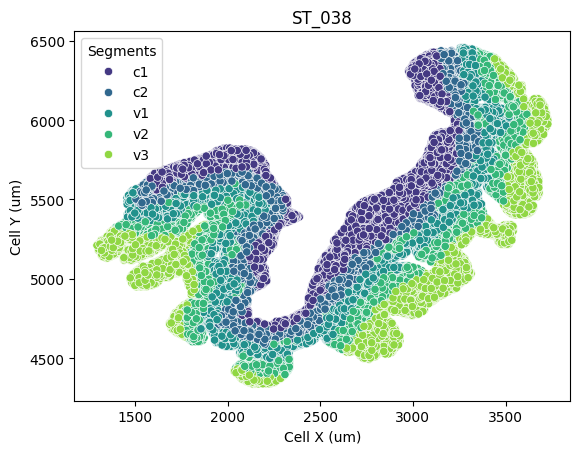

ST_052


/tmp/ipykernel_1976219/1644935003.py:27: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_villi.obs['villi_part'] = pd.qcut(
/tmp/ipykernel_1976219/1644935003.py:35: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_crypt.obs['crypt_part'] = pd.qcut(
/tmp/ipykernel_1976219/1644935003.py:41: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample.obs['villi_part'] = all_ad_sample_villi.obs['villi_part']
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/matrixlib/defmatrix.py:451: RuntimeWarning: Mean of empty slice.
  return N.ndarray.mean(self, axis, dtype, out, keepdims=True)._collapse(axis)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/_core/_methods.py:136: RuntimeWarning: invalid value encountered in divide
  ret = um.true_div

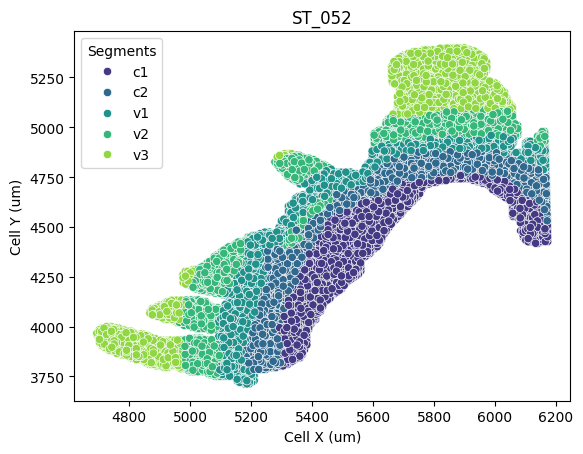

ST_046


/tmp/ipykernel_1976219/1644935003.py:27: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_villi.obs['villi_part'] = pd.qcut(
/tmp/ipykernel_1976219/1644935003.py:35: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_crypt.obs['crypt_part'] = pd.qcut(
/tmp/ipykernel_1976219/1644935003.py:41: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample.obs['villi_part'] = all_ad_sample_villi.obs['villi_part']
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/matrixlib/defmatrix.py:451: RuntimeWarning: Mean of empty slice.
  return N.ndarray.mean(self, axis, dtype, out, keepdims=True)._collapse(axis)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/_core/_methods.py:136: RuntimeWarning: invalid value encountered in divide
  ret = um.true_div

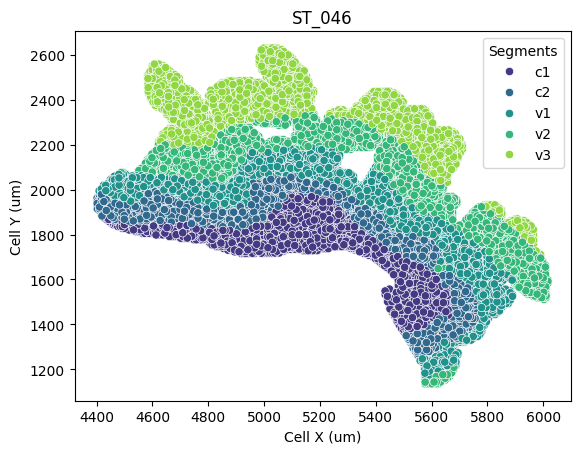

celiac
ST_073


/tmp/ipykernel_1976219/1644935003.py:32: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_villi.obs['villi_part'] = 'v1'
/tmp/ipykernel_1976219/1644935003.py:35: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_crypt.obs['crypt_part'] = pd.qcut(
/tmp/ipykernel_1976219/1644935003.py:41: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample.obs['villi_part'] = all_ad_sample_villi.obs['villi_part']
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/matrixlib/defmatrix.py:451: RuntimeWarning: Mean of empty slice.
  return N.ndarray.mean(self, axis, dtype, out, keepdims=True)._collapse(axis)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/_core/_methods.py:136: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(

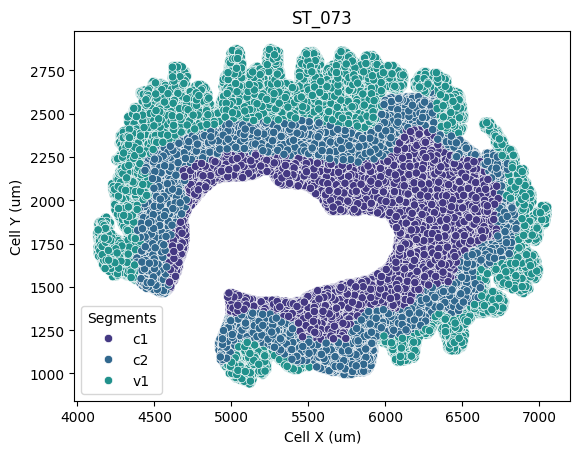

ST_054


/tmp/ipykernel_1976219/1644935003.py:32: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_villi.obs['villi_part'] = 'v1'
/tmp/ipykernel_1976219/1644935003.py:35: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_crypt.obs['crypt_part'] = pd.qcut(
/tmp/ipykernel_1976219/1644935003.py:41: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample.obs['villi_part'] = all_ad_sample_villi.obs['villi_part']
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/matrixlib/defmatrix.py:451: RuntimeWarning: Mean of empty slice.
  return N.ndarray.mean(self, axis, dtype, out, keepdims=True)._collapse(axis)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/_core/_methods.py:136: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(

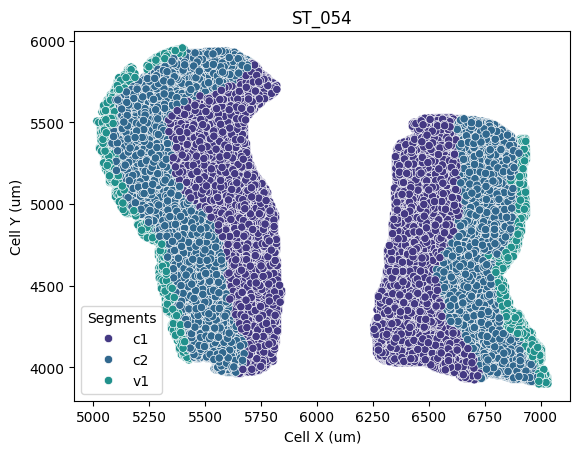

ST_004


/tmp/ipykernel_1976219/1644935003.py:32: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_villi.obs['villi_part'] = 'v1'
/tmp/ipykernel_1976219/1644935003.py:35: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_crypt.obs['crypt_part'] = pd.qcut(
/tmp/ipykernel_1976219/1644935003.py:41: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample.obs['villi_part'] = all_ad_sample_villi.obs['villi_part']
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/matrixlib/defmatrix.py:451: RuntimeWarning: Mean of empty slice.
  return N.ndarray.mean(self, axis, dtype, out, keepdims=True)._collapse(axis)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/_core/_methods.py:136: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(

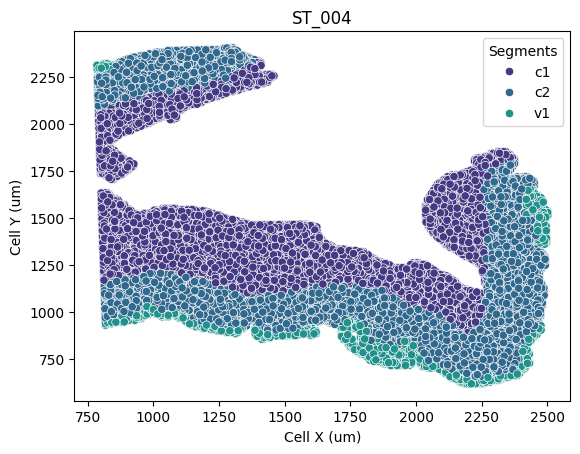

ST_072


/tmp/ipykernel_1976219/1644935003.py:32: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_villi.obs['villi_part'] = 'v1'
/tmp/ipykernel_1976219/1644935003.py:35: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_crypt.obs['crypt_part'] = pd.qcut(
/tmp/ipykernel_1976219/1644935003.py:41: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample.obs['villi_part'] = all_ad_sample_villi.obs['villi_part']
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/matrixlib/defmatrix.py:451: RuntimeWarning: Mean of empty slice.
  return N.ndarray.mean(self, axis, dtype, out, keepdims=True)._collapse(axis)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/_core/_methods.py:136: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(

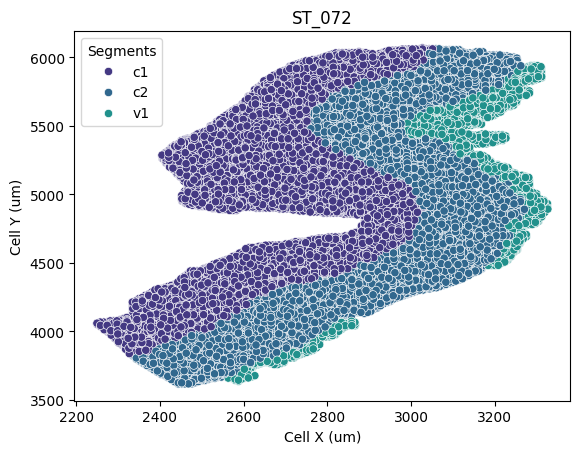

ST_060


/tmp/ipykernel_1976219/1644935003.py:32: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_villi.obs['villi_part'] = 'v1'
/tmp/ipykernel_1976219/1644935003.py:35: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_crypt.obs['crypt_part'] = pd.qcut(
/tmp/ipykernel_1976219/1644935003.py:41: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample.obs['villi_part'] = all_ad_sample_villi.obs['villi_part']
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/matrixlib/defmatrix.py:451: RuntimeWarning: Mean of empty slice.
  return N.ndarray.mean(self, axis, dtype, out, keepdims=True)._collapse(axis)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/_core/_methods.py:136: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(

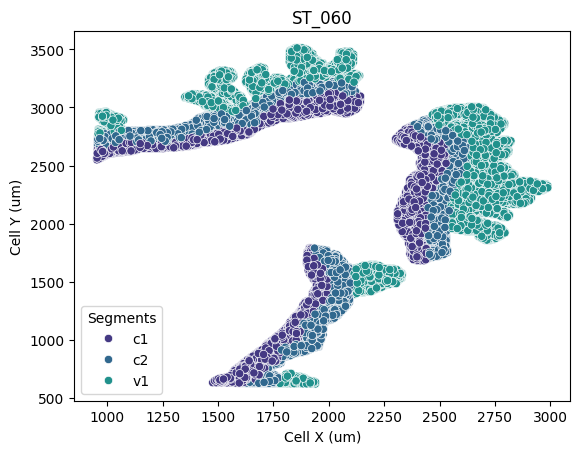

ST_105


/tmp/ipykernel_1976219/1644935003.py:32: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_villi.obs['villi_part'] = 'v1'
/tmp/ipykernel_1976219/1644935003.py:35: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_crypt.obs['crypt_part'] = pd.qcut(
/tmp/ipykernel_1976219/1644935003.py:41: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample.obs['villi_part'] = all_ad_sample_villi.obs['villi_part']
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/matrixlib/defmatrix.py:451: RuntimeWarning: Mean of empty slice.
  return N.ndarray.mean(self, axis, dtype, out, keepdims=True)._collapse(axis)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/_core/_methods.py:136: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(

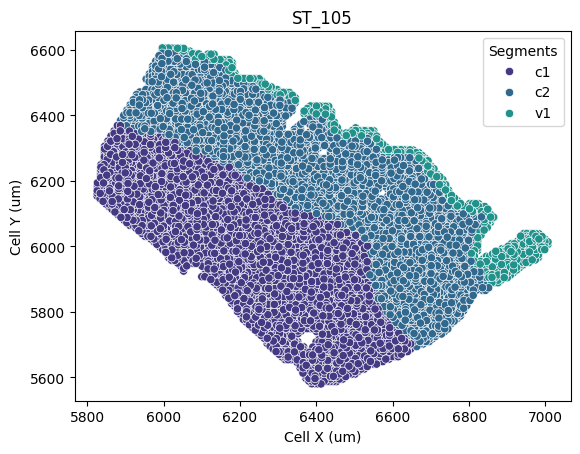

ST_102


/tmp/ipykernel_1976219/1644935003.py:32: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_villi.obs['villi_part'] = 'v1'
/tmp/ipykernel_1976219/1644935003.py:35: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_crypt.obs['crypt_part'] = pd.qcut(
/tmp/ipykernel_1976219/1644935003.py:41: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample.obs['villi_part'] = all_ad_sample_villi.obs['villi_part']
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/matrixlib/defmatrix.py:451: RuntimeWarning: Mean of empty slice.
  return N.ndarray.mean(self, axis, dtype, out, keepdims=True)._collapse(axis)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/_core/_methods.py:136: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(

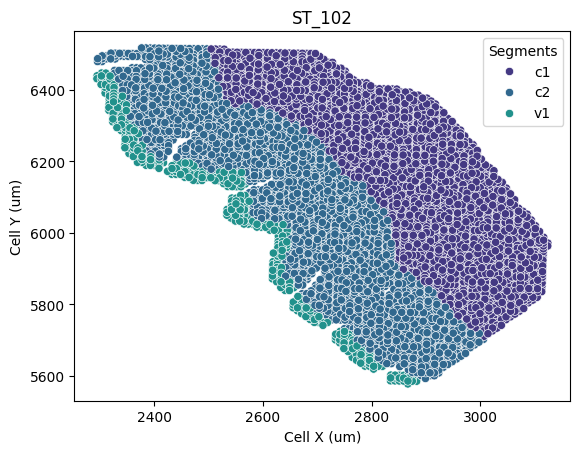

ST_076


/tmp/ipykernel_1976219/1644935003.py:32: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_villi.obs['villi_part'] = 'v1'
/tmp/ipykernel_1976219/1644935003.py:35: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_crypt.obs['crypt_part'] = pd.qcut(
/tmp/ipykernel_1976219/1644935003.py:41: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample.obs['villi_part'] = all_ad_sample_villi.obs['villi_part']
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/matrixlib/defmatrix.py:451: RuntimeWarning: Mean of empty slice.
  return N.ndarray.mean(self, axis, dtype, out, keepdims=True)._collapse(axis)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/_core/_methods.py:136: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(

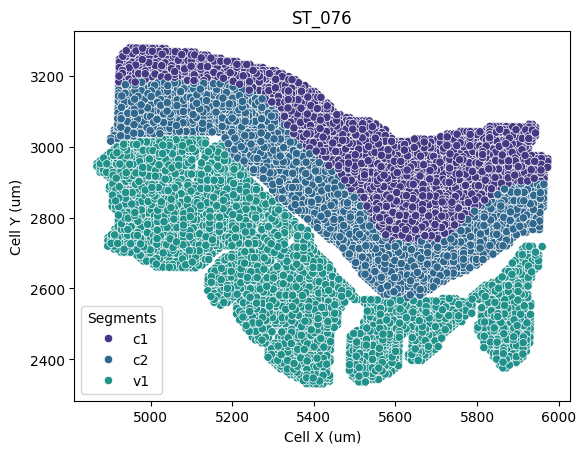

ST_080B1


/tmp/ipykernel_1976219/1644935003.py:32: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_villi.obs['villi_part'] = 'v1'
/tmp/ipykernel_1976219/1644935003.py:35: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_crypt.obs['crypt_part'] = pd.qcut(
/tmp/ipykernel_1976219/1644935003.py:41: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample.obs['villi_part'] = all_ad_sample_villi.obs['villi_part']
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/matrixlib/defmatrix.py:451: RuntimeWarning: Mean of empty slice.
  return N.ndarray.mean(self, axis, dtype, out, keepdims=True)._collapse(axis)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/_core/_methods.py:136: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(

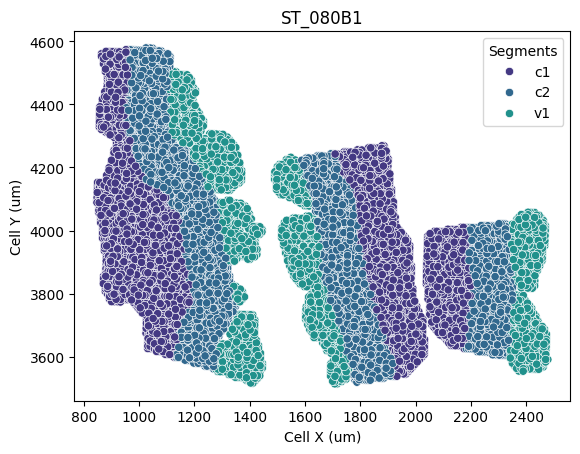

ST_109B1


/tmp/ipykernel_1976219/1644935003.py:32: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_villi.obs['villi_part'] = 'v1'
/tmp/ipykernel_1976219/1644935003.py:35: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_crypt.obs['crypt_part'] = pd.qcut(
/tmp/ipykernel_1976219/1644935003.py:41: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample.obs['villi_part'] = all_ad_sample_villi.obs['villi_part']
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/matrixlib/defmatrix.py:451: RuntimeWarning: Mean of empty slice.
  return N.ndarray.mean(self, axis, dtype, out, keepdims=True)._collapse(axis)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/_core/_methods.py:136: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(

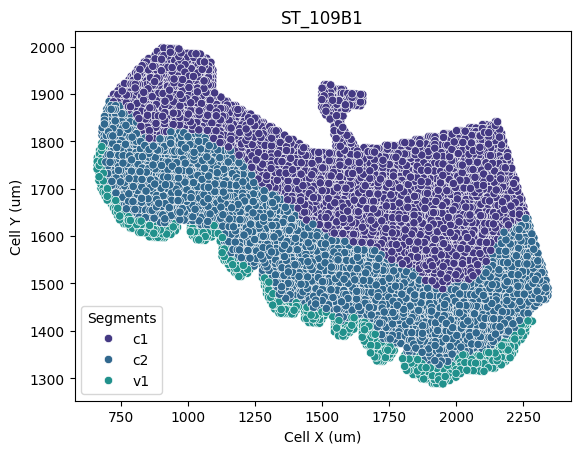

ST_080B2


/tmp/ipykernel_1976219/1644935003.py:32: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_villi.obs['villi_part'] = 'v1'
/tmp/ipykernel_1976219/1644935003.py:35: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_crypt.obs['crypt_part'] = pd.qcut(
/tmp/ipykernel_1976219/1644935003.py:41: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample.obs['villi_part'] = all_ad_sample_villi.obs['villi_part']
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/matrixlib/defmatrix.py:451: RuntimeWarning: Mean of empty slice.
  return N.ndarray.mean(self, axis, dtype, out, keepdims=True)._collapse(axis)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/_core/_methods.py:136: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(

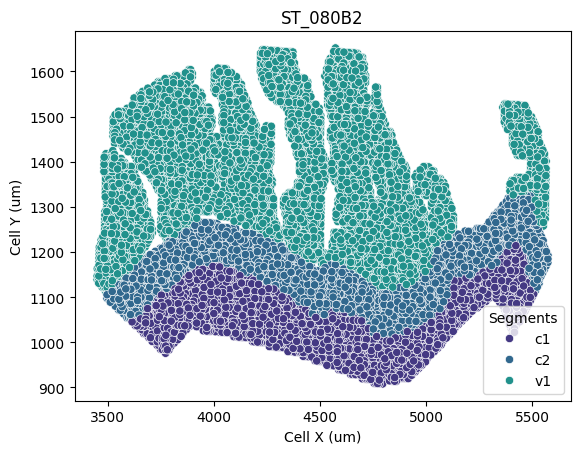

ST_109B2


/tmp/ipykernel_1976219/1644935003.py:32: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_villi.obs['villi_part'] = 'v1'
/tmp/ipykernel_1976219/1644935003.py:35: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample_crypt.obs['crypt_part'] = pd.qcut(
/tmp/ipykernel_1976219/1644935003.py:41: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  all_ad_sample.obs['villi_part'] = all_ad_sample_villi.obs['villi_part']
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/matrixlib/defmatrix.py:451: RuntimeWarning: Mean of empty slice.
  return N.ndarray.mean(self, axis, dtype, out, keepdims=True)._collapse(axis)
/home/talbarka/miniconda3/envs/spatial_ced_2/lib/python3.13/site-packages/numpy/_core/_methods.py:136: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(

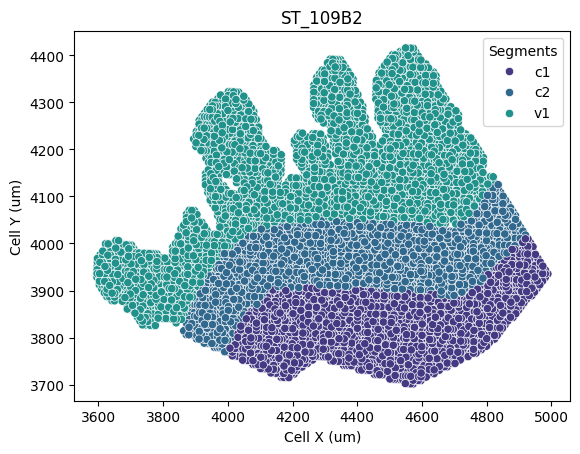

nan


In [20]:
# add crypt and villus zones
n_crypts = 2
n_villi = 3

all_ad = joint_ad[joint_ad.obs['pixel_class'].isin(["epithelium", "non_epithelium"])].copy()

segment_names = [f'c{i+1}' for i in range(n_crypts)] + [f'v{i+1}' for i in range(n_villi)]
samples_dict = dict()
all_ad.obs['crypt_villi_part'] = None
joint_ad.obs['crypt_villi_part'] = None
# identify crypt_pixels
for my_group in all_ad.obs['group'].unique():
    print(my_group)
    for sample_name in all_ad.obs['sample_name'].unique():
        all_ad_sample = all_ad[
            (all_ad.obs['group'] == my_group) * 
            (all_ad.obs['sample_name'] == sample_name)]
        
        if all_ad_sample.shape[0] == 0:
            continue

        print(sample_name)
        all_ad_sample_villi = all_ad_sample[all_ad_sample.obs['villus']]

        if my_group in ['control']:
            # take the villi splots and devide them into n_villi parts by distance from the crypt-villus border
            all_ad_sample_villi.obs['villi_part'] = pd.qcut(
                all_ad_sample_villi.obs['lowest_lumen'], 
                n_villi, 
                labels=[f'v{i+1}' for i in range(n_villi)])
        elif my_group == 'celiac':
            all_ad_sample_villi.obs['villi_part'] = 'v1'

        all_ad_sample_crypt = all_ad_sample[all_ad_sample.obs['MM_LP_crypt']]
        all_ad_sample_crypt.obs['crypt_part'] = pd.qcut(
            all_ad_sample_crypt.obs['lowest_lumen'], 
            n_crypts, 
            labels=[f'c{i+1}' for i in reversed(range(n_crypts))])
        
        # Assign villi_part and crypt_part back to the main sample obs
        all_ad_sample.obs['villi_part'] = all_ad_sample_villi.obs['villi_part']
        all_ad_sample.obs['crypt_part'] = all_ad_sample_crypt.obs['crypt_part']

        # Combine villi_part and crypt_part into a single column
        all_ad_sample.obs['crypt_villi_part'] = all_ad_sample.obs['villi_part'].combine_first(all_ad_sample.obs['crypt_part'])

        # write to all_ad.obs['crypt_villi_part']
        all_ad.obs.loc[all_ad_sample.obs_names,'crypt_villi_part'] = all_ad_sample.obs.loc[all_ad_sample.obs_names, 'crypt_villi_part']
        joint_ad.obs.loc[all_ad_sample.obs_names,'crypt_villi_part'] = all_ad_sample.obs.loc[all_ad_sample.obs_names, 'crypt_villi_part']

        # calculcate the mean gene expression for each crypt_villi_part
        tmp_df = pd.DataFrame(columns=all_ad_sample.var_names, index=segment_names,data = np.nan)
        for part in all_ad_sample.obs['crypt_villi_part'].unique():
            tmp_df.loc[part] = np.ravel(all_ad_sample[all_ad_sample.obs['crypt_villi_part'] == part].layers['mat_norm'].todense().mean(axis=0))
        samples_dict[sample_name] = tmp_df

        # Define a color palette for the segments
        my_palette = sns.color_palette("viridis", n_colors=n_crypts+n_villi)
        segment_palette = {'c1': my_palette[0], 'c2': my_palette[1], 'v1': my_palette[2], 'v2': my_palette[3], 'v3': my_palette[4]}
        sns.scatterplot(
            data=all_ad_sample.obs, 
            x='cell_x_um', 
            y='cell_y_um', 
            hue='crypt_villi_part', 
            palette=segment_palette
        )
        #  sort the legend according to segment names order
        handles, labels = plt.gca().get_legend_handles_labels()
        order = [f'c{i+1}' for i in range(n_crypts)] + [f'v{i+1}' for i in range(n_villi)]
        order = [label for label in order if label in labels]
        handles = [handles[labels.index(label)] for label in order]
        plt.legend(handles=handles, labels=order, title='Segments')
        plt.xlabel('Cell X (um)')
        plt.ylabel('Cell Y (um)')
        plt.title(sample_name)
        plt.show()

In [21]:
intersected_pixels = np.intersect1d(st33.obs_names, all_ad.obs_names)
st33.obs['crypt_villi_part'] = np.nan
st33.obs.loc[intersected_pixels, 'crypt_villi_part'] = all_ad.obs.loc[intersected_pixels, 'crypt_villi_part']


/tmp/ipykernel_1976219/529895977.py:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[nan nan nan ... nan nan nan]' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  st33.obs.loc[intersected_pixels, 'crypt_villi_part'] = all_ad.obs.loc[intersected_pixels, 'crypt_villi_part']


In [22]:
# # create boxplot for sum of umi per pixel in the epithelial and non-epithelial compartment
# all_samples = joint_ad.obs.sample_name.unique()
# # dropna from all_samples
# all_samples = all_samples[~pd.isna(all_samples)]

# umi_compartment_df = pd.DataFrame(index=all_samples, columns=['epithelium','non_epithelium'])

# # fill the table with median sum of UMI per compartment
# for my_sample in all_samples:
#     my_ad = joint_ad[joint_ad.obs['sample_name'] == my_sample]
#     umi_compartment_df.loc[my_sample, 'epithelium'] = my_ad.obs.loc[my_ad.obs['pixel_class'] == 'epithelium', 'sum_of_umis'].median()
#     umi_compartment_df.loc[my_sample, 'non_epithelium'] = my_ad.obs.loc[my_ad.obs['pixel_class'] == 'non_epithelium', 'sum_of_umis'].median()

# # show connected dots between two boxplots
# sns.boxplot(data=umi_compartment_df)
# sns.swarmplot(data=umi_compartment_df, color='k')
# # add lines for each row
# for i in range(umi_compartment_df.shape[0]):
#     plt.plot([0, 1], umi_compartment_df.iloc[i], color='k', linewidth=0.5)
# plt.xlabel('Compartment')
# plt.ylabel('Median sum of UMIs per pixel')
# sns.despine()

## Export
### Joint adata

In [23]:
# export to dill
with open("/mnt/d/celiac_files/joint_ad.dill", "wb") as f:
    dill.dump(joint_ad, f)

In [24]:
# export to dill
with open("joint_ad.dill", "wb") as f:
    dill.dump(joint_ad, f)

In [25]:
print(datetime.now())

2026-01-12 09:17:19.155074


In [26]:
print(session_info2.session_info(dependencies=True))

geopandas	1.1.1
pandas	2.3.3
scanpy	1.11.4
numpy	2.3.3
tqdm	4.67.1
seaborn	0.13.2
matplotlib	3.10.6
scipy	1.16.2
dill	0.4.0
squidpy	1.6.5
spatialdata-plot	0.2.12
anndata	0.12.2
shapely	2.1.2
----	----
stack-data	0.6.3
ipykernel	6.30.1
PyYAML	6.0.3
requests	2.32.5
spatialdata	0.5.0
pyct	0.6.0
sphinxcontrib-qthelp	2.0.0
dask-image	2024.5.3
wrapt	1.17.3
sphinxcontrib-serializinghtml	2.0.0
pyarrow	21.0.0
scikit-learn	1.7.2
ipython	9.6.0
charset-normalizer	3.4.3
jaraco.functools	4.0.1
leidenalg	0.10.2
natsort	8.4.0
idna	3.10
pytz	2025.2
jupyter_core	5.8.1
fsspec	2025.9.0
traitlets	5.14.3
multipledispatch	1.0.0 (0.6.0)
parso	0.8.5
texttable	1.7.0
xarray-spatial	0.4.0
xarray	2025.9.1
patsy	1.0.1
pure_eval	0.2.3
jaraco.collections	5.1.0
pyparsing	3.2.5
scikit-image	0.25.2
certifi	2025.8.3 (2025.08.03)
pillow	11.3.0
et_xmlfile	2.0.0
wcwidth	0.2.14
python-dateutil	2.9.0.post0
asciitree	0.3.3
packaging	25.0
tifffile	2025.9.30
debugpy	1.8.17
attrs	25.3.0
h5py	3.14.0
xarray-dataclass	3.0.0
kiwisolv